In [1]:
import anndata
import scanpy as sc
import os
import matplotlib.pyplot as plt
import omicverse as ov
import numpy as np
import seaborn as sns
%matplotlib inline
plt.rcParams.update({'font.size': 12})


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.3, Tutorials: https://omicverse.readthedocs.io/


In [2]:
#####Change path and Load data
os.chdir("/storage2/liuxiaodongLab/fanxueying/embryo_benchmarking_rebuttal")
adata = anndata.read_h5ad("./data/human_all_2025_scib_6_23.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 34554 × 60428
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'anno', 'sub_anno', 'harmo.anno', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors', 'umap'
    obsm: 'CCA', 'FastMNN', 'Harmony', 'LIGER', 'Scanorama', 'Unintegrated', 'X_CCA', 'X_FastMNN', 'X_Harmony', 'X_LIGER', 'X_Scanorama', 'X_

In [4]:
adata.obsm['X_umap']=adata.obsm['X_scANVI']

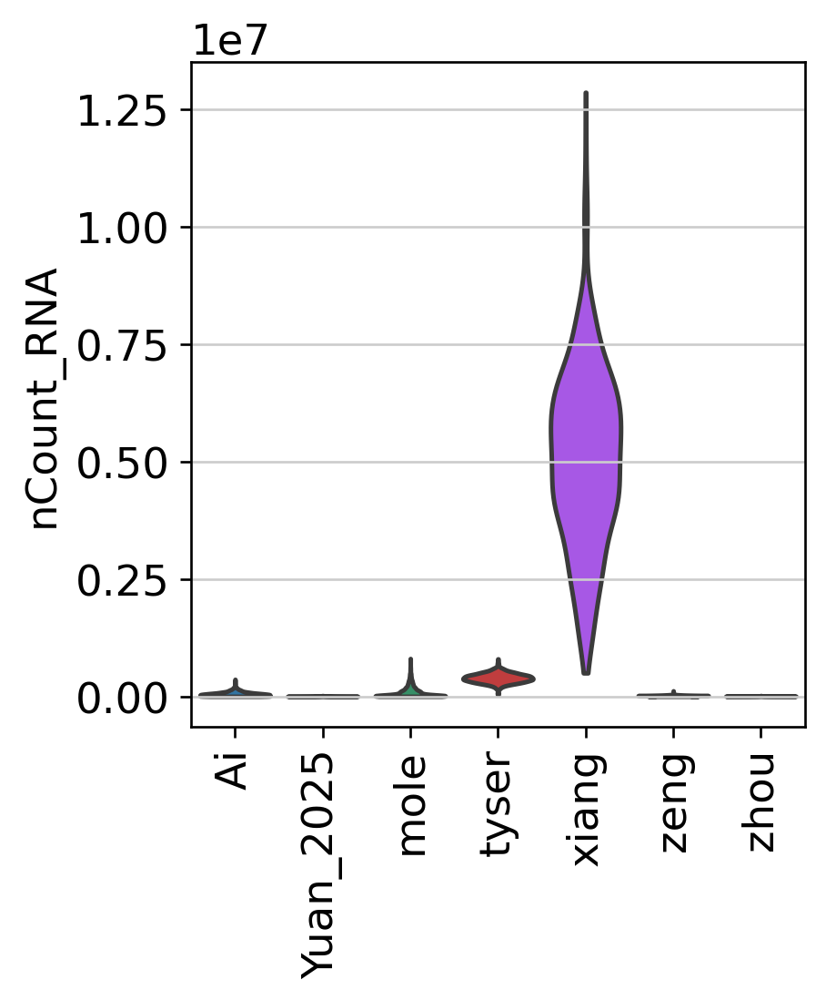

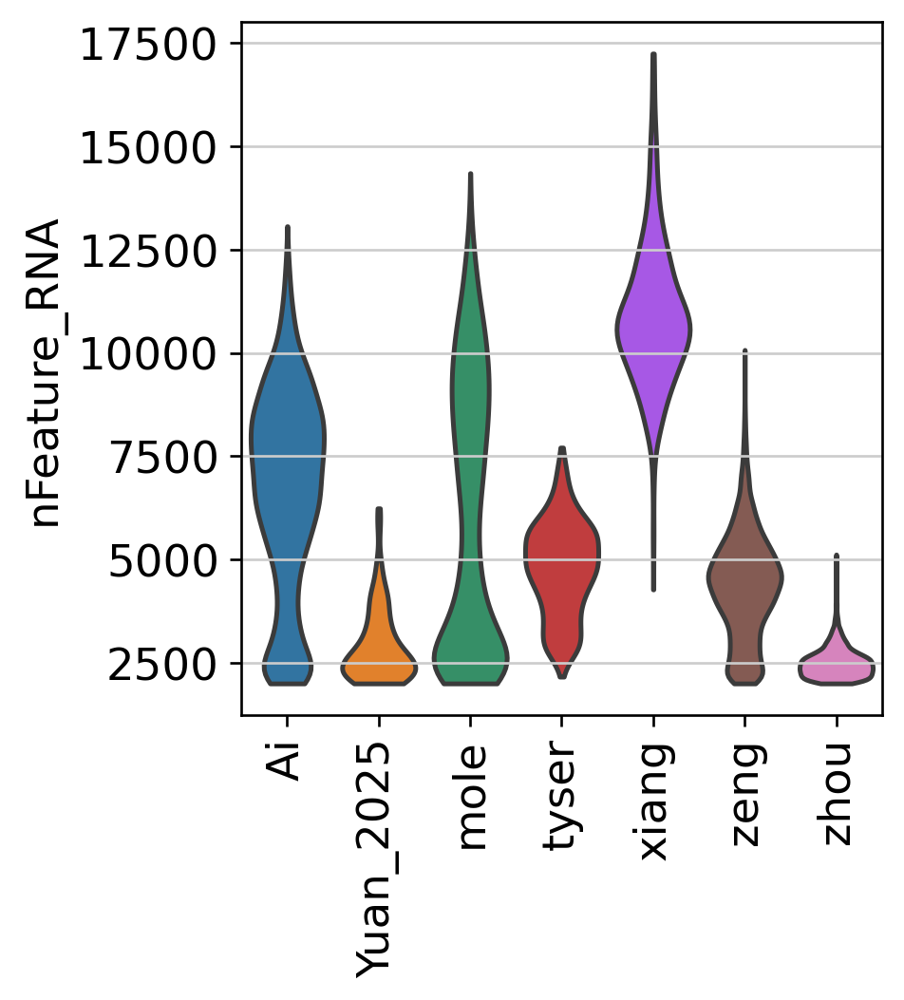

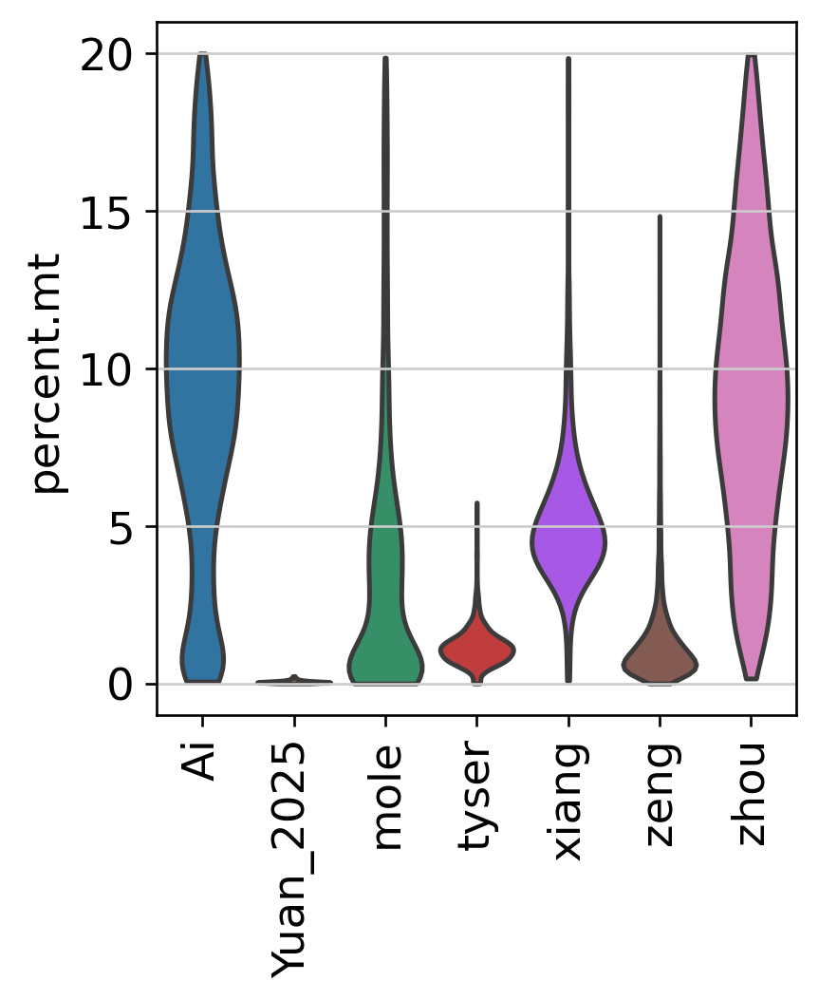

In [5]:
sc.pl.violin(
    adata,
    ["nCount_RNA"],
   groupby="orig.ident", jitter=0.4,
    multi_panel=True,rotation=90,stripplot=False, save='_nCount_RNA.pdf' )

sc.pl.violin(
    adata,
    ["nFeature_RNA"],
   groupby="orig.ident", jitter=0.4,
    multi_panel=True,rotation=90,stripplot=False, save='_nFeature_RNA.pdf')

sc.pl.violin(
    adata,
    ["percent.mt"],
   groupby="orig.ident", jitter=0.4,
    multi_panel=True,rotation=90,stripplot=False,save='_percent_mt.pdf' )

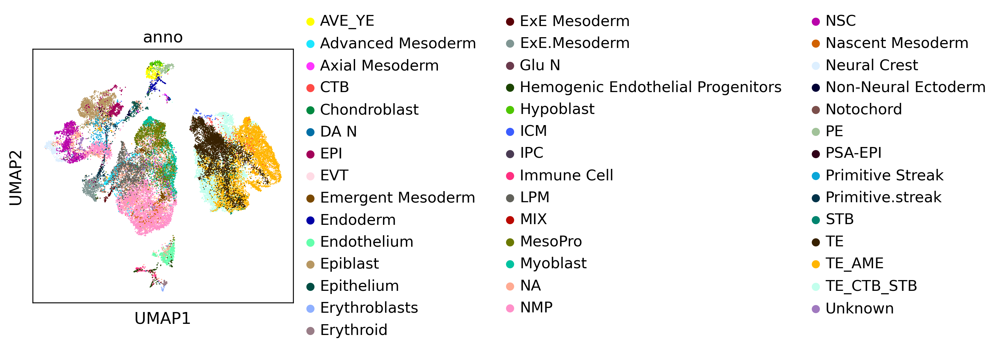

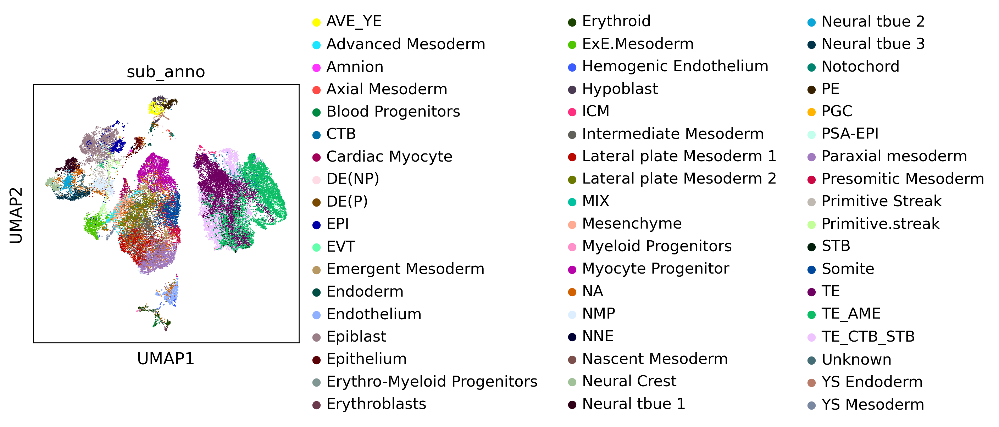

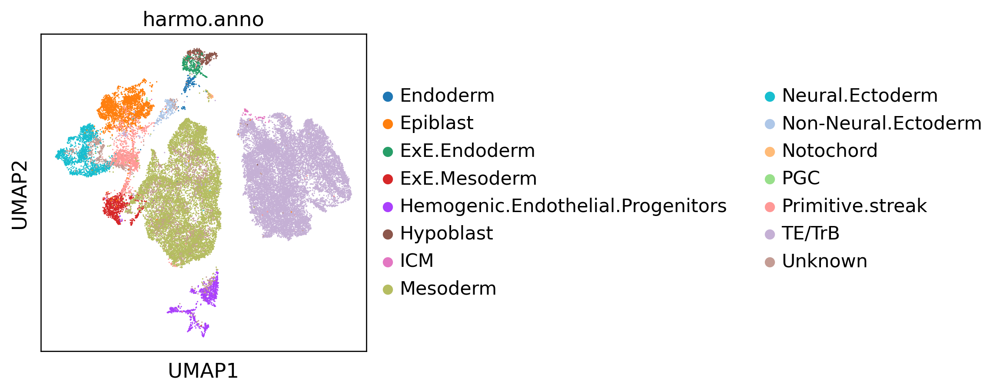

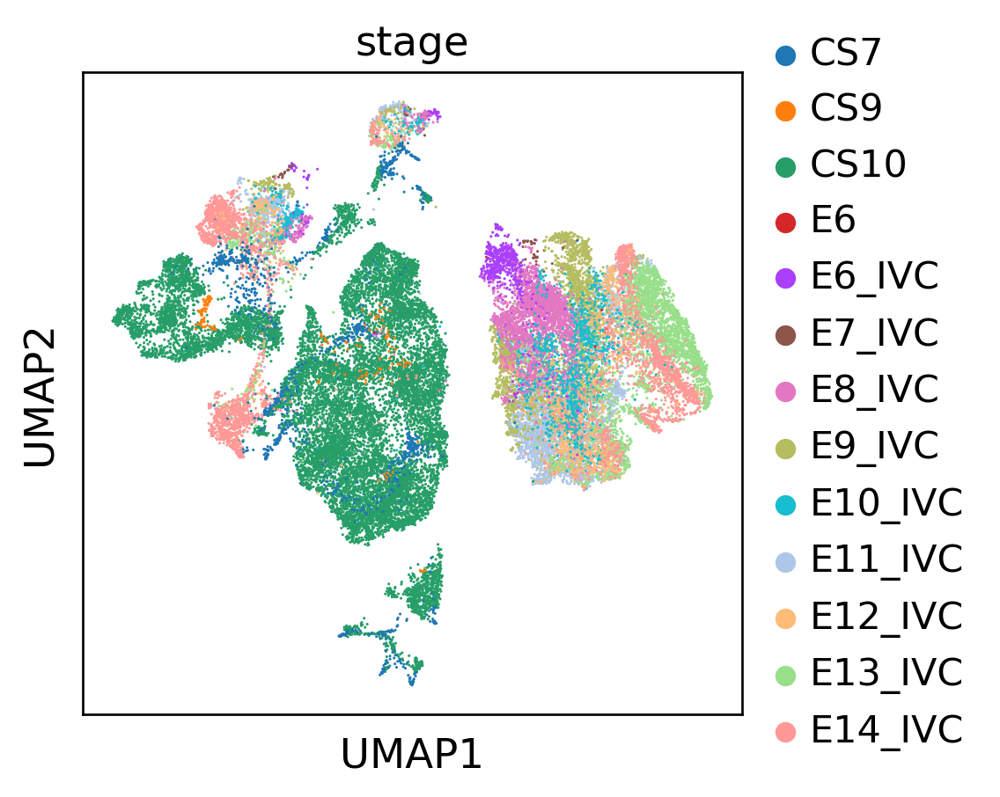

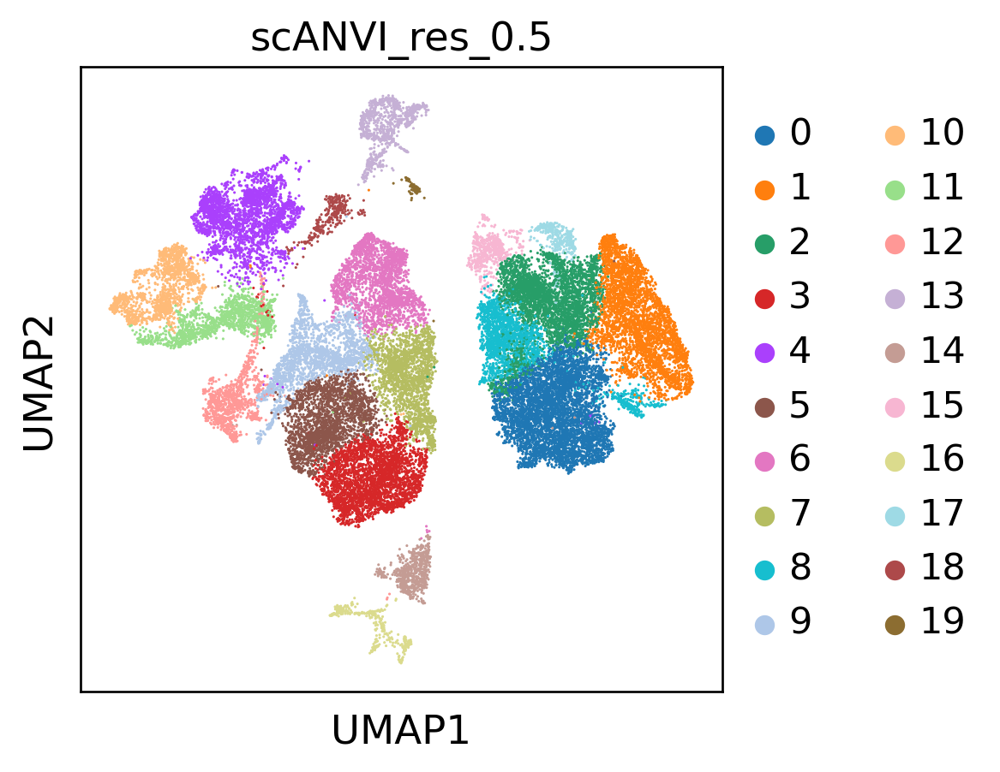

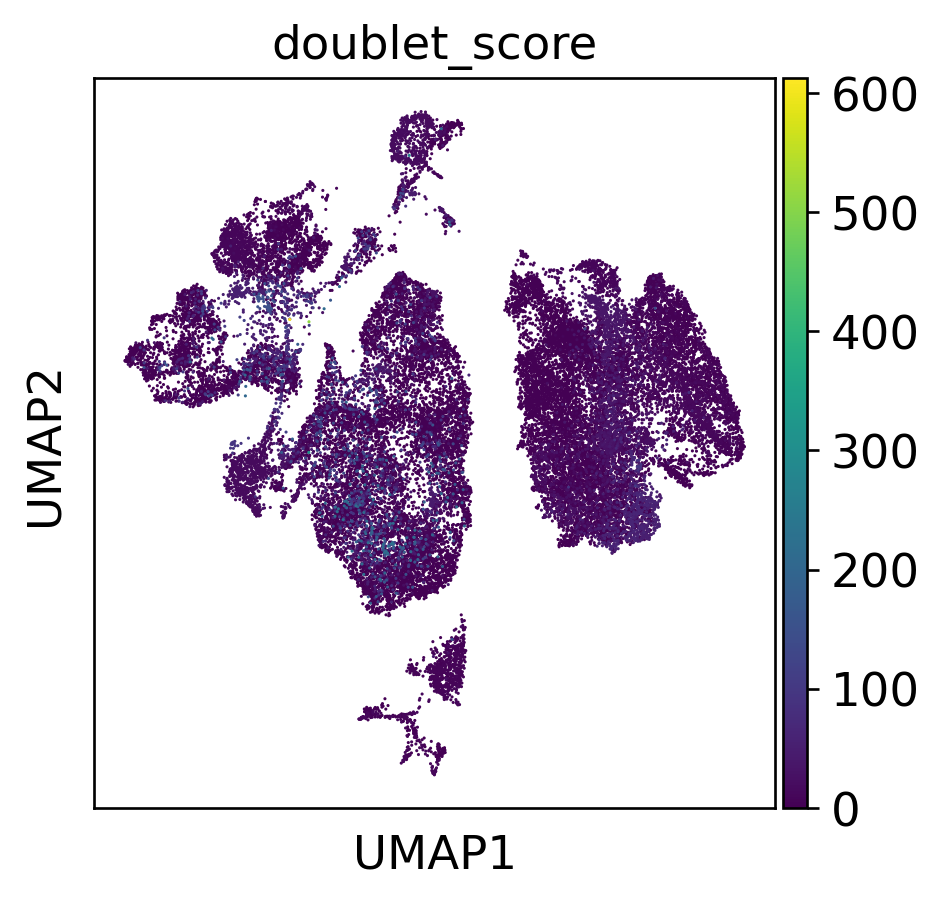

In [6]:
sc.pl.umap(adata, color=['anno'],save='_anno.pdf')
sc.pl.umap(adata, color=['sub_anno'],save='_sub_anno.pdf')
sc.pl.umap(adata, color=['harmo.anno'],save='_harmo_anno.pdf')
sc.pl.umap(adata, color=['stage'],save='_stage.pdf')
sc.pl.umap(adata, color=['scANVI_res_0.5'])
sc.pl.umap(adata, color=['doublet_score'])

In [7]:
adata

AnnData object with n_obs × n_vars = 34554 × 60428
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'anno', 'sub_anno', 'harmo.anno', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors', 'umap', 'anno_colors', 'sub_anno_colors'
    obsm: 'CCA', 'FastMNN', 'Harmony', 'LIGER', 'Scanorama', 'Unintegrated', 'X_CCA', 'X_FastMNN', 'X_Harmo

In [8]:
#rename dataset labels
adata.obs.rename(columns={'anno': 'orig_anno'}, inplace=True)
adata.obs.rename(columns={'sub_anno': 'orig_sub_anno'}, inplace=True)

In [9]:
#nested clustering
#download three scripts from github
#https://github.com/LungCellAtlas/HLCA_reproducibility/blob/main/scripts
import scanpy.external as sce
import sys
import nested_clustering
import analysis

In [10]:
number_of_clust_levels = 3
use_rep = "scANVI"
for clustering_level in range(1, number_of_clust_levels + 1):
    print("clustering level:", clustering_level, "...")
    if clustering_level == 1:
        # skip for re-run
        cluster_name = "leiden_1"
        # first clustering is not nested, so use normal function:
        sc.pp.neighbors(adata, n_neighbors=30, use_rep=use_rep)
        sc.tl.leiden(adata, resolution=0.01, key_added=cluster_name)
    else:
        previous_clustering = "leiden_" + str(clustering_level - 1)
        cluster_name = "leiden_" + str(clustering_level)
        #         perform nested clustering
        #         set parameters:
        res = 0.2
        if clustering_level == 2:
            k = 30
            min_cluster_size = 50
        elif clustering_level == 3:
            k = 15
            min_cluster_size = 30
        elif clustering_level == 4:
            k = 10
            min_cluster_size = 10

        adata = nested_clustering.add_nested_clustering_blind(
            adata,
            previous_clustering,
            cluster_name,
            use_rep=use_rep,
            cluster_alg="leiden",
            cluster_k=k,
            cluster_res=res,
            min_cluster_size=min_cluster_size,
            redo_pca=False,  # SET THIS TO FALSE FOR SCANVI!!! OR OTHER EMBEDDING-OUTPUT METHODS!!!!!
        )

clustering level: 1 ...
clustering level: 2 ...
Not re-doing pca before nested clustering iterations!
Cluster: 0
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 1
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
clustering level: 3 ...
Not re-doing pca before nested clustering iterations!
Cluster: 0.0
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.1
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.10
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.11
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.2
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.3
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clustering
Cluster: 0.4
reclustering...

calculating 30 nearest neighbors
using rep: scANVI
clust

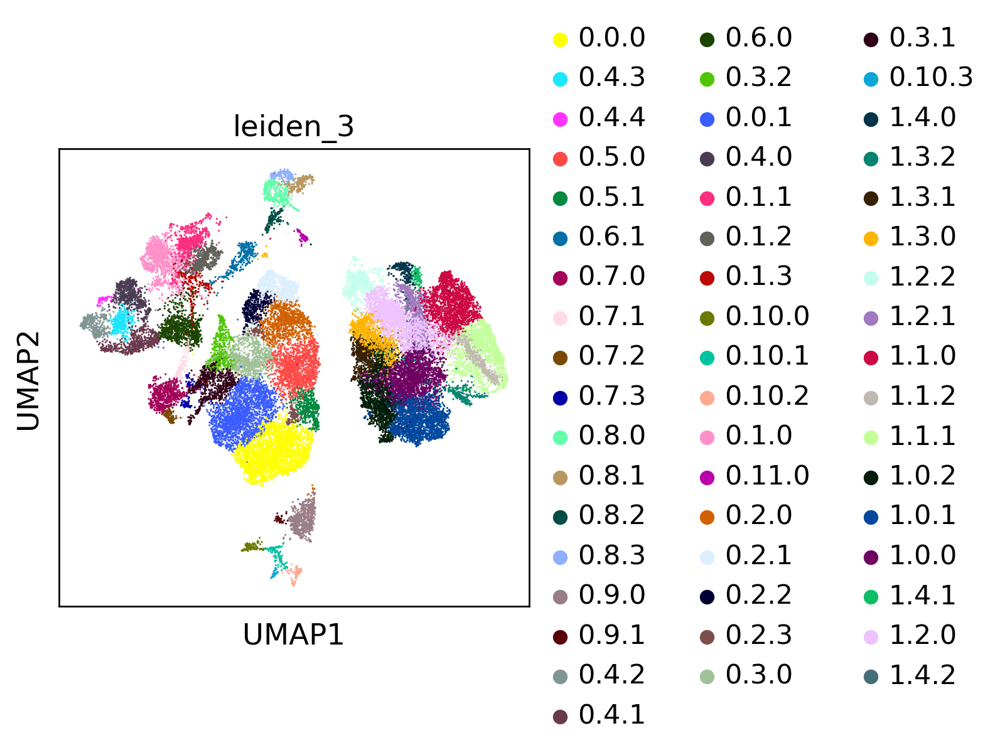

In [11]:
# plot
sc.pl.umap(adata, color=cluster_name)

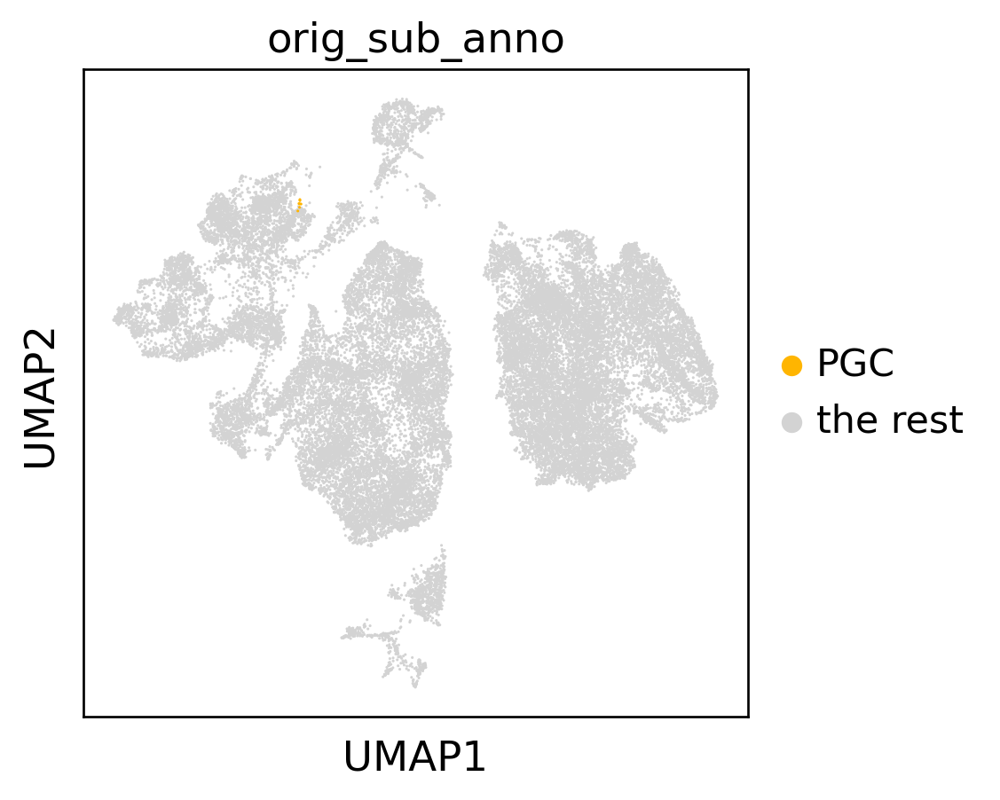

In [12]:
# Plot UMAP with specified colors and groups
ax = sc.pl.umap(adata, color=["orig_sub_anno"], groups=["PGC"], show=False)

# Change legend text from "NA" to "other cell types"
legend_texts = ax.get_legend().get_texts()
for legend_text in legend_texts:
    if legend_text.get_text() == "NA":
        legend_text.set_text("the rest")

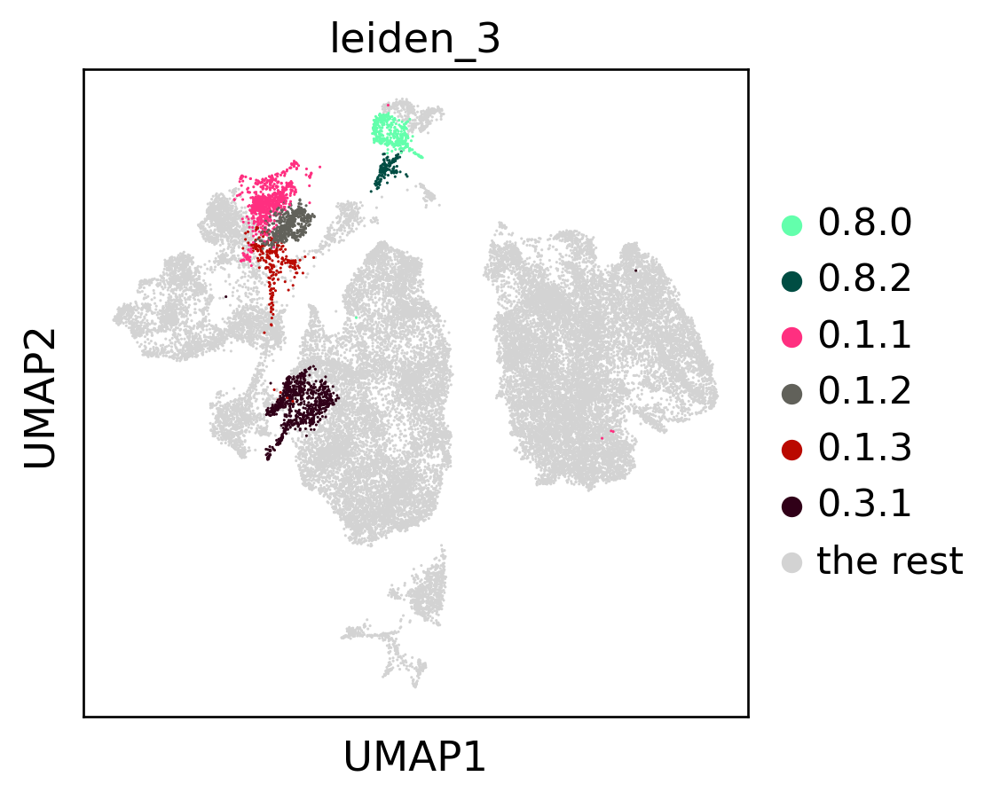

In [13]:
# Plot UMAP with specified colors and groups
ax = sc.pl.umap(adata, color=["leiden_3"], groups=[ '0.1.1', '0.1.2','0.1.3','0.3.1','0.8.0','0.8.2'], show=False)

# Change legend text from "NA" to "other cell types"
legend_texts = ax.get_legend().get_texts()
for legend_text in legend_texts:
    if legend_text.get_text() == "NA":
        legend_text.set_text("the rest")

In [14]:
# further subclustering specific clusters to get reported cell populations
cls_to_recluster = [
    "0.1.1",
    "0.1.2", #for epi and PGC  
    "0.1.3", 
    "0.3.1",
    "0.8.0", # for Yolk sac endoderm
    "0.8.2", # for Gut
    
] 

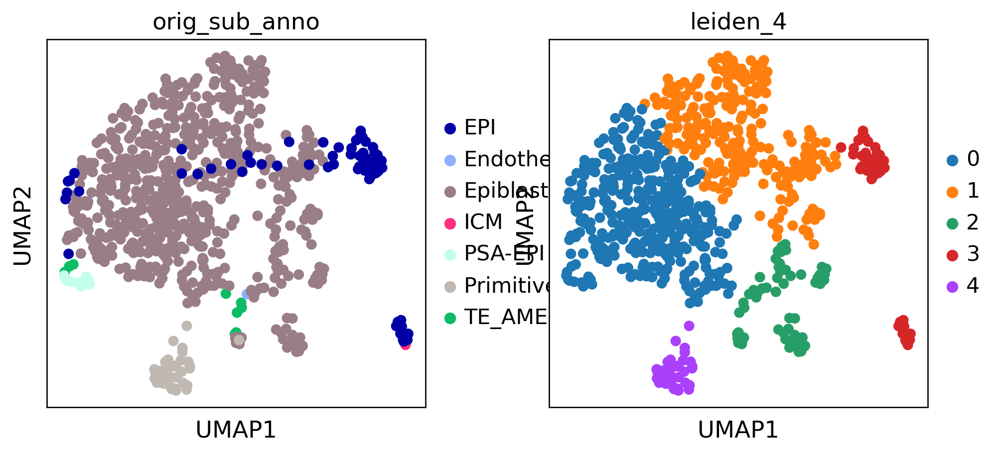

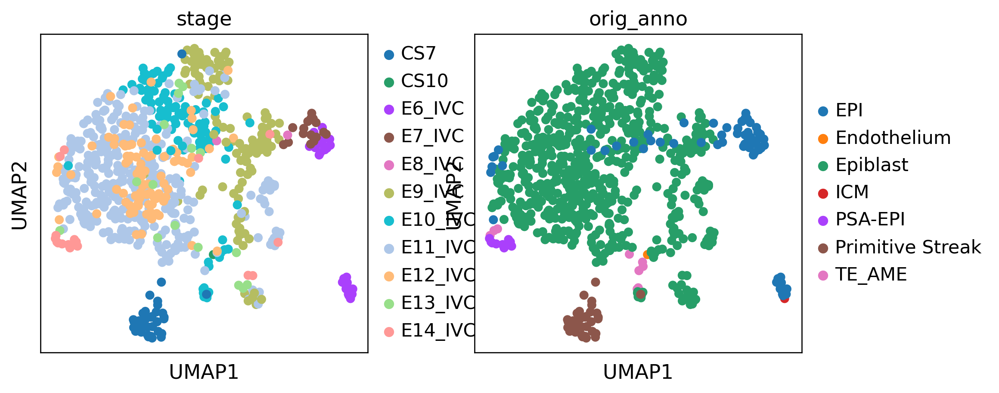

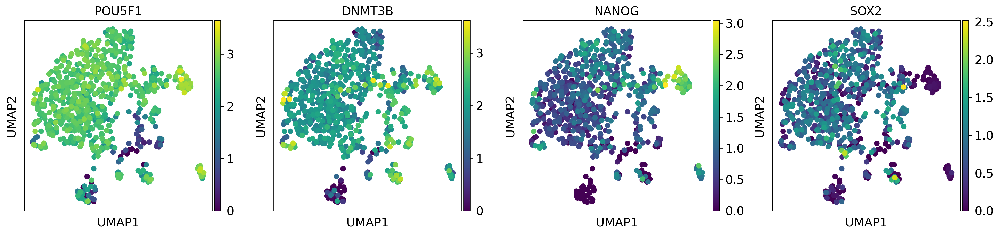

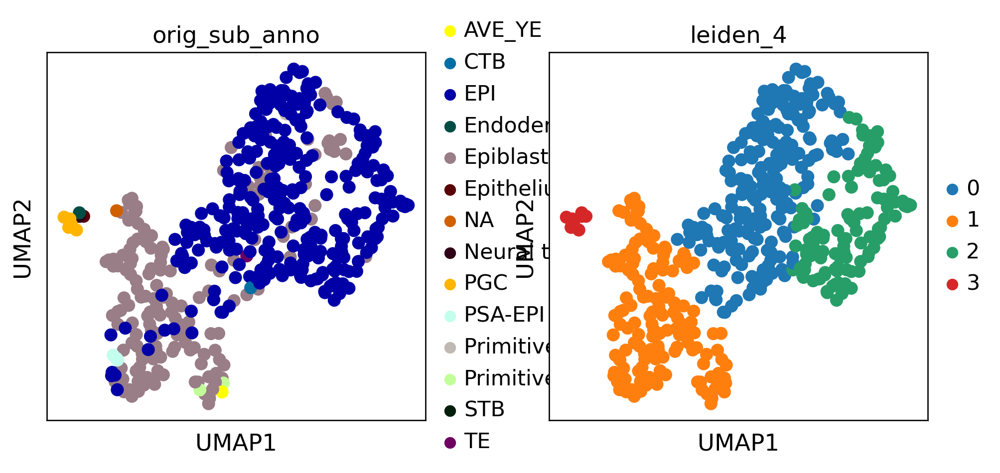

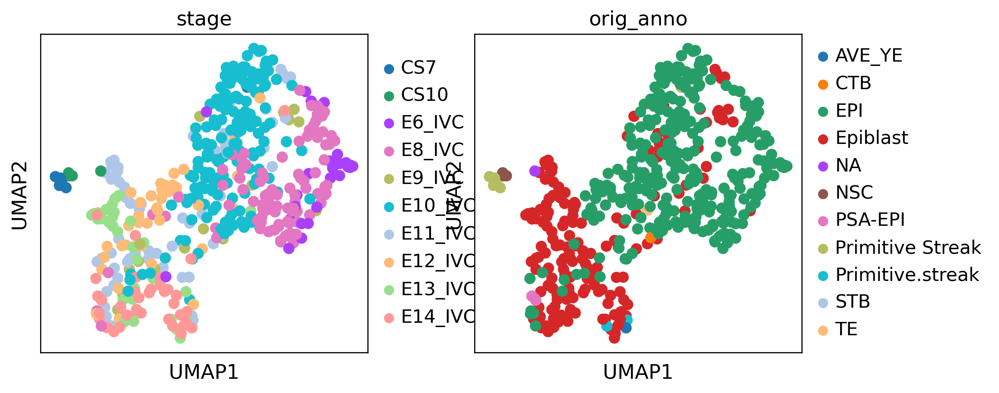

...

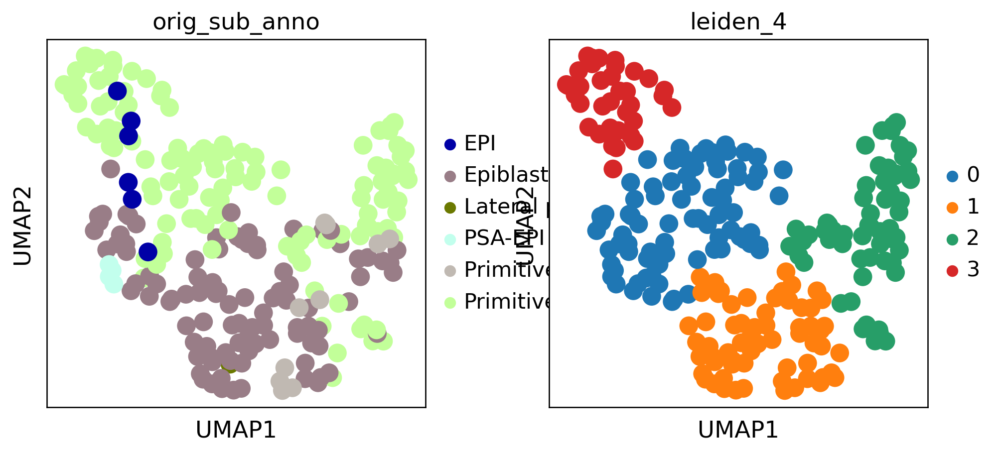

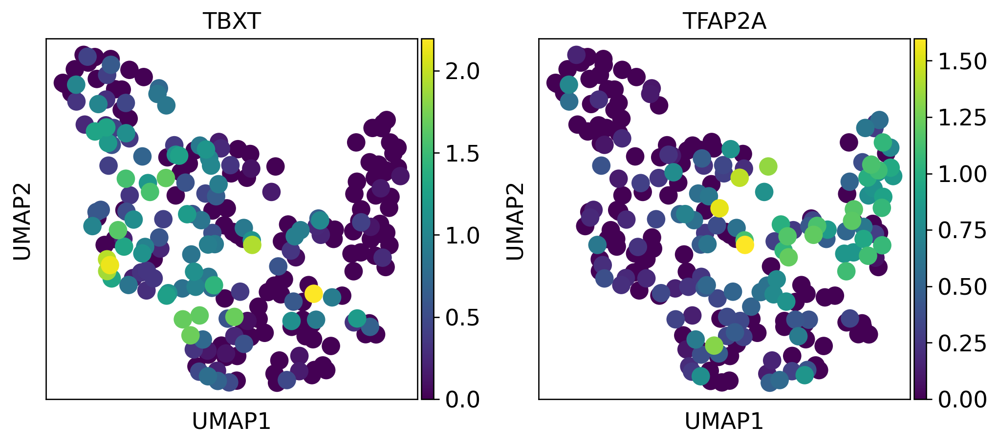

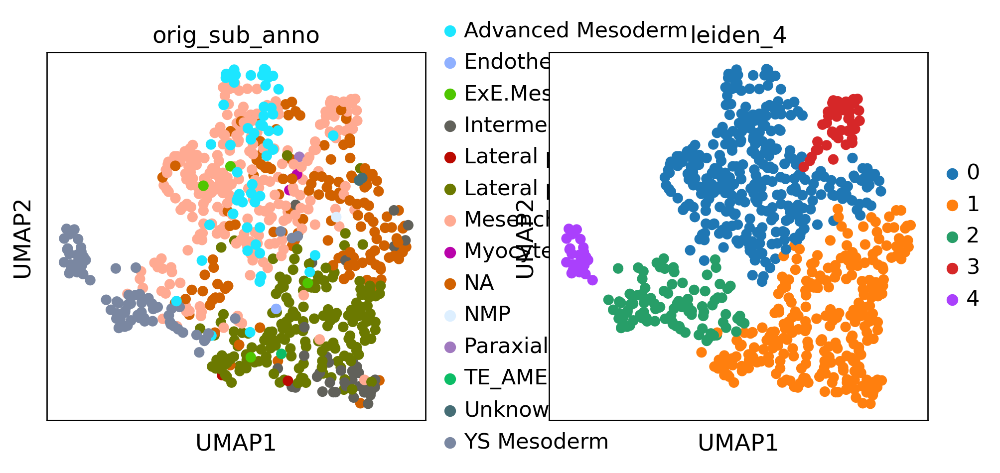

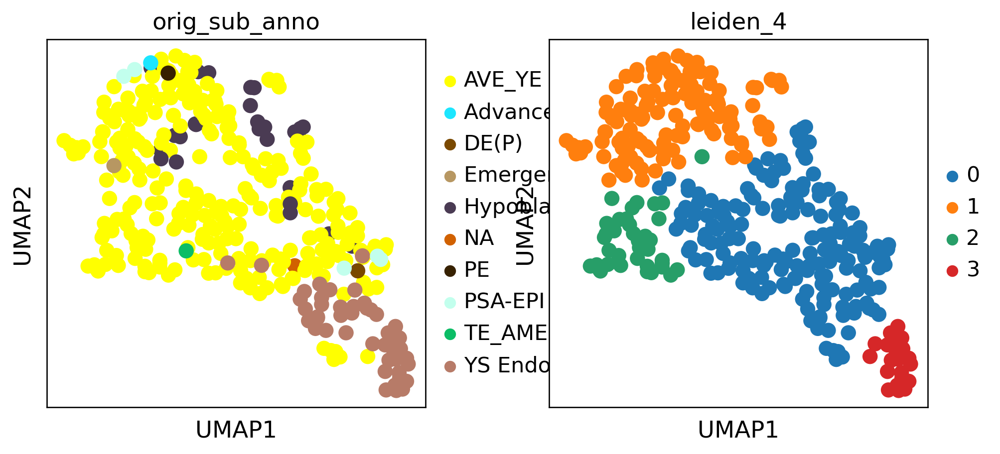

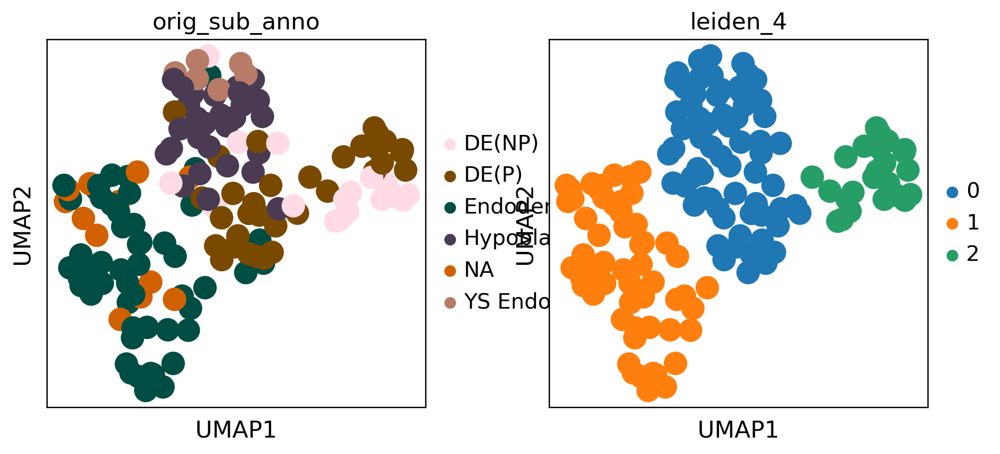

In [15]:
for cl_to_recluster in cls_to_recluster:
    subadata = adata[adata.obs.leiden_3 == cl_to_recluster, :].copy()
    sc.pp.neighbors(subadata, n_neighbors=7, use_rep="scANVI", metric="cosine")
    sc.tl.umap(subadata)
    sc.tl.leiden(subadata, resolution=0.2, key_added="leiden_4")
    
    # Plot and check which cluster is which
    if cl_to_recluster == "0.1.1":
        sc.pl.umap(subadata, color=["orig_sub_anno", "leiden_4"])
        sc.pl.umap(subadata, color=["stage", "orig_anno"])
        sc.pl.umap(subadata, color=["POU5F1", "DNMT3B", "NANOG", "SOX2" ], use_raw=False)

    elif cl_to_recluster == "0.1.2":
        sc.pl.umap(subadata, color=["orig_sub_anno", "leiden_4"])
        sc.pl.umap(subadata, color=["stage", "orig_anno"])
        sc.pl.umap(subadata, color=["POU5F1", "DNMT3B", "NANOG", "NANOS3", "PDPN", "SOX17","PRDM1" ], use_raw=False)

    elif cl_to_recluster == "0.1.3":
        sc.pl.umap(subadata, color=["orig_sub_anno", "leiden_4"])
        sc.pl.umap(subadata, color=["TBXT", "TFAP2A" ], use_raw=False)
    
    elif cl_to_recluster == "0.3.1":
        sc.pl.umap(subadata, color=["orig_sub_anno", "leiden_4"])
    
    elif cl_to_recluster == "0.8.0":
        sc.pl.umap(subadata, color=["orig_sub_anno", "leiden_4"])
    
    elif cl_to_recluster == "0.8.2":
        sc.pl.umap(subadata, color=["orig_sub_anno", "leiden_4"])
    
    
    # Add clustering info to main object
    if "leiden_4" not in adata.obs.columns:
        adata.obs["leiden_4"] = np.nan  # Initialize with NaN if not present

    # Update "leiden_4" for the relevant cells
    adata.obs.loc[subadata.obs.index, "leiden_4"] = [
        f"{l4}.{l5}" for l4, l5 in zip(subadata.obs.leiden_3, subadata.obs.leiden_4)
    ]

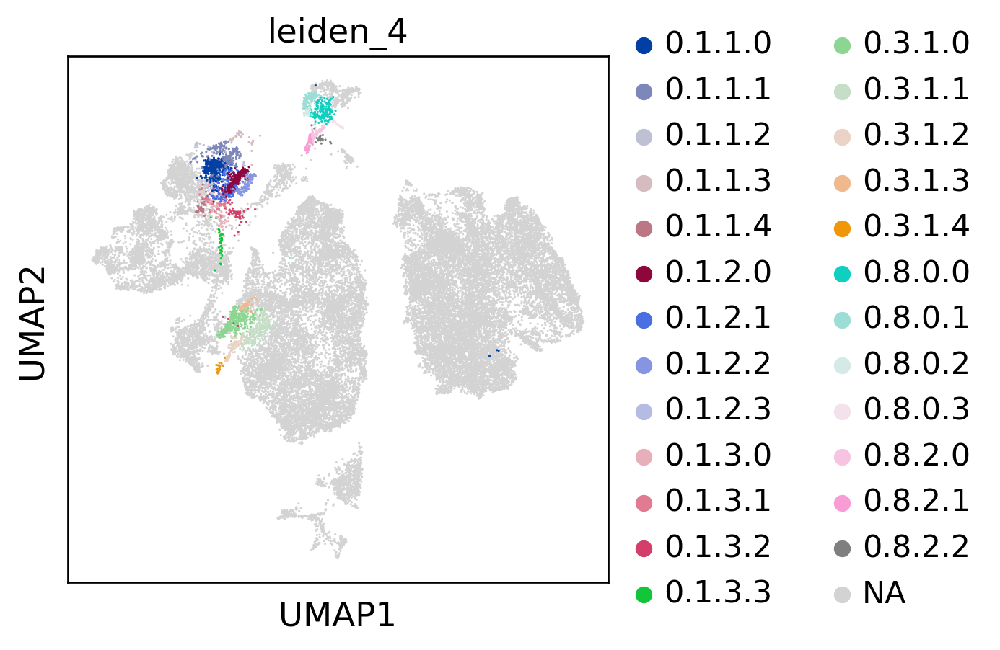

In [16]:
# plot
sc.pl.umap(adata, color="leiden_4")

In [17]:
#replace leiden3 "0.1.2"  by leiden4
# Identify the clusters in leiden_3 that you want to replace
clusters_to_replace = ['0.1.1', '0.1.2','0.1.3','0.3.1','0.8.0','0.8.2']  # replace with your cluster IDs

# Convert leiden_3 and leiden_4 to strings to avoid category mismatches
adata.obs['leiden_3'] = adata.obs['leiden_3'].astype(str)
adata.obs['leiden_4'] = adata.obs['leiden_4'].astype(str)

# Create a copy of leiden_3 to modify
new_leiden_3 = adata.obs['leiden_3'].copy()

# Replace the specified clusters with the subcluster information from leiden_4
for cluster in clusters_to_replace:
    mask = adata.obs['leiden_3'] == cluster
    new_leiden_3[mask] = adata.obs['leiden_4'][mask]

# Update the AnnData object with the new leiden_3 column
adata.obs['leiden_3'] = new_leiden_3

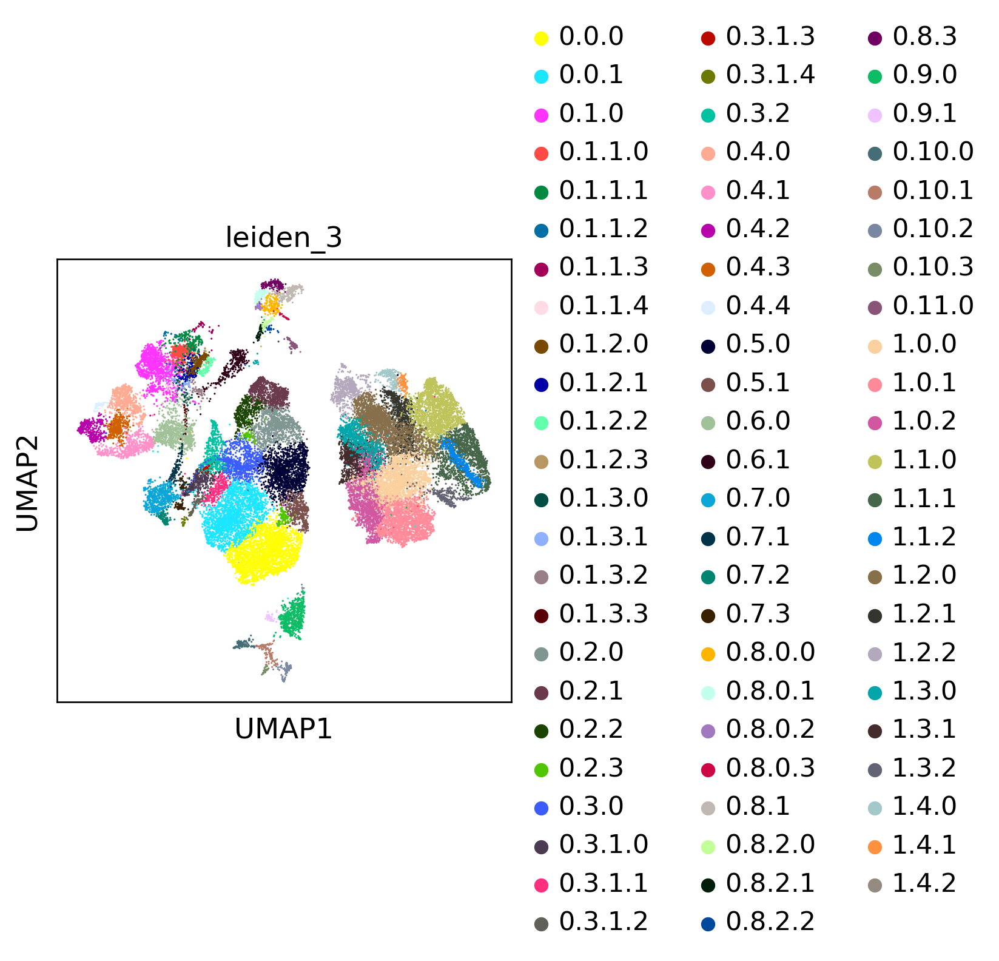

In [18]:
# plot
sc.pl.umap(adata, color="leiden_3")

In [19]:
# Filter out cells with doublet_score > 500
adata = adata[adata.obs['doublet_score'] <= 100].copy()
adata

AnnData object with n_obs × n_vars = 33861 × 60428
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'orig_anno', 'orig_sub_anno', 'harmo.anno', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors', 'umap', 'anno_colors', 'sub_anno_colors', 'leiden_3_colors', 'orig_sub_anno_colors'
    ob

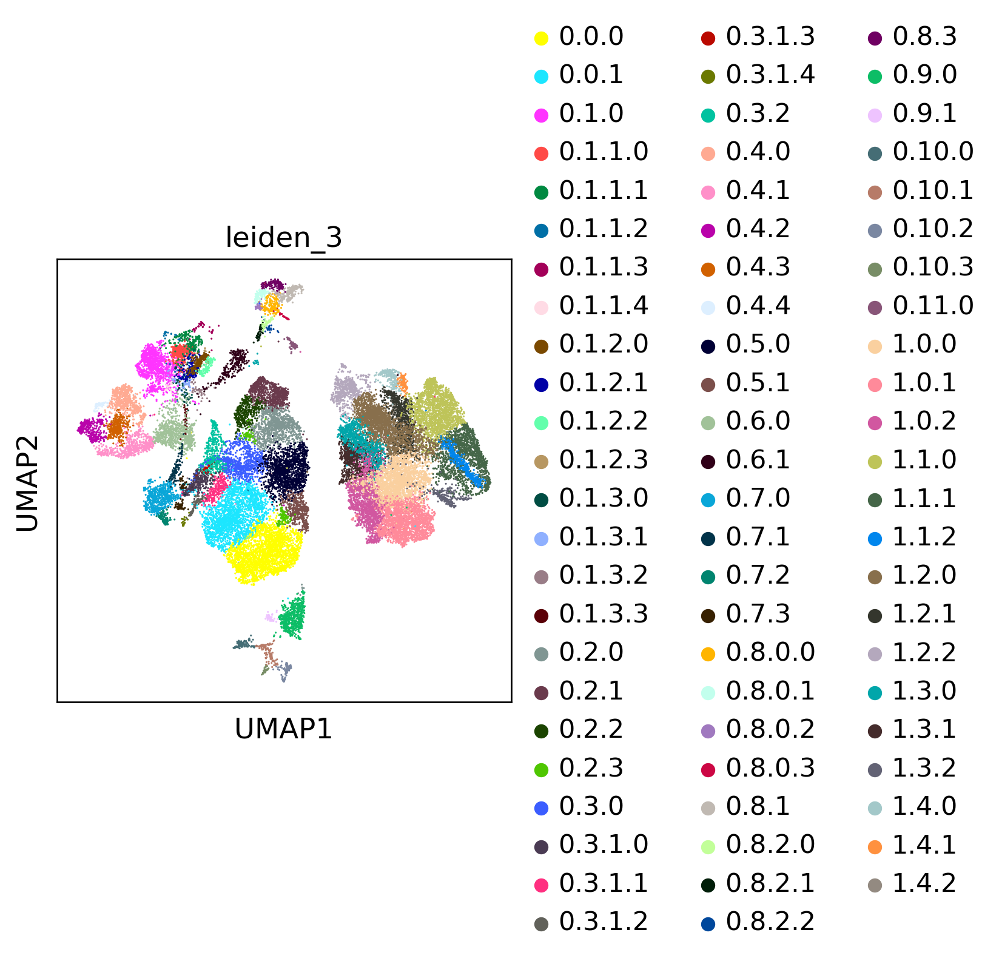

In [20]:
# plot
sc.pl.umap(adata, color="leiden_3")

In [21]:
import seaborn as sns

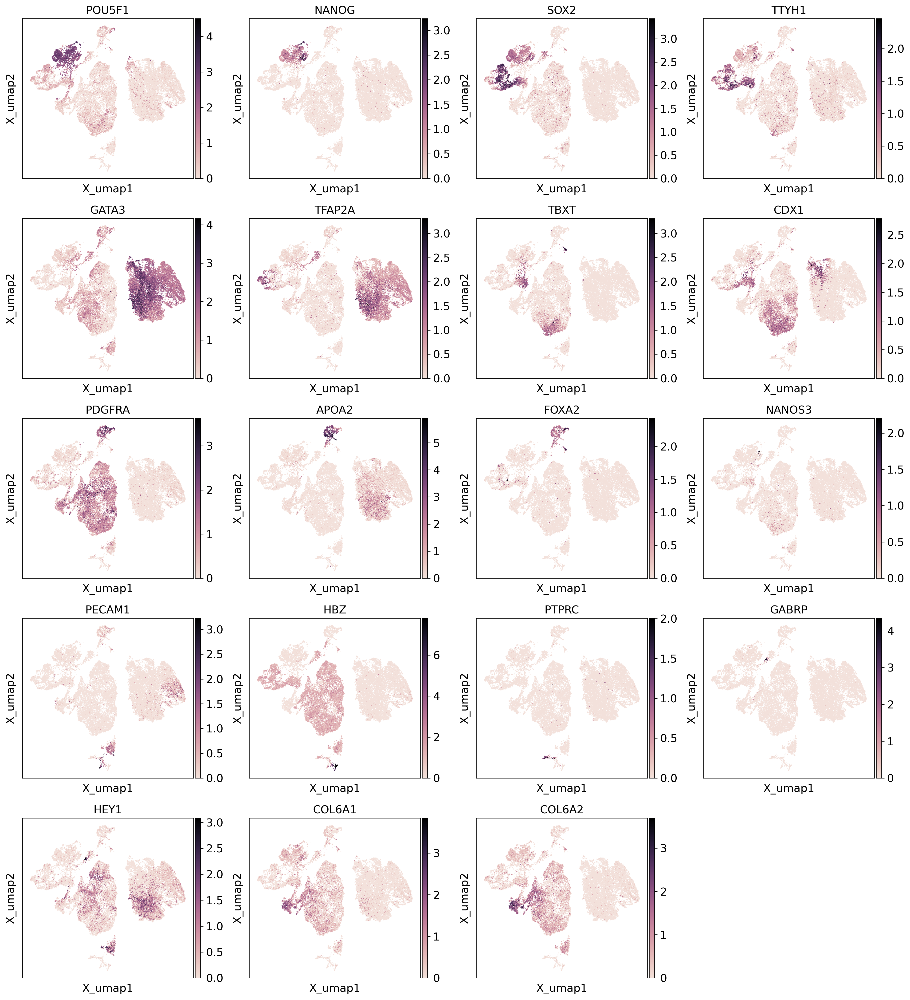

In [22]:
# Define the list of genes you want to plot
genes_to_plot = ["POU5F1","NANOG",#epiblast
                 "SOX2", "TTYH1", #Neural_ectoderm
                 "GATA3","TFAP2A",
                 "TBXT",  "CDX1","PDGFRA","APOA2","FOXA2","NANOS3",
                "PECAM1","HBZ","PTPRC",
                "GABRP","HEY1","COL6A1","COL6A2",]  # Replace "GENE2" and "GENE3" with the actual gene names

# Plot the UMAP embedding for the specified genes
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=genes_to_plot,
    use_raw=False,
    cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True)
)

In [23]:
adata

AnnData object with n_obs × n_vars = 33861 × 60428
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'orig_anno', 'orig_sub_anno', 'harmo.anno', 'doublet', 'doublet_score', 'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5', 'Harmony_res_0.5', 'scVI_res_0.5', 'scANVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4'
    var: 'features', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors', 'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors', 'harmo.anno_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'scVI_res_0.5_colors', 'stage_colors', 'umap', 'anno_colors', 'sub_anno_colors', 'leiden_3_colors', 'orig_sub_anno_colors'
    ob

In [24]:
# Remove unwanted columns from .obs
del_cols = [
    'Unintegrated_res_0.5', 'Scanorama_res_0.5', 'LIGER_res_0.5',
    'Harmony_res_0.5', 'scVI_res_0.5', 'CCA_res_0.5', 'FastMNN_res_0.5',
    'leiden_1', 'leiden_2', 'leiden_4',
    
    # Also remove these if they exist in .obs (seems like typo in your message)
    'CCA', 'FastMNN', 'Harmony', 'LIGER', 'Scanorama', 'Unintegrated',
    'X_CCA', 'X_FastMNN', 'X_Harmony', 'X_LIGER', 'X_Scanorama', 'X_Unintegrated',
    'X_scVI', 'scANVI', 'scVI'
]

for col in del_cols:
    if col in adata.obs.columns:
        del adata.obs[col]
    elif col in adata.obsm.keys():
        del adata.obsm[col]
    else:
        print(f"Column '{col}' not found in .obs or .obsm")

# Remove unwanted keys from .uns
del_uns = [
    'CCA_res_0.5_colors', 'FastMNN_res_0.5_colors', 'Harmony_res_0.5_colors',
    'LIGER_res_0.5_colors', 'Scanorama_res_0.5_colors', 'Unintegrated_res_0.5_colors',
    'scVI_res_0.5_colors', 'anno_colors', 'sub_anno_colors'
]

for key in del_uns:
    if key in adata.uns:
        del adata.uns[key]
    else:
        print(f"Key '{key}' not found in .uns")

# List of columns to delete from .var
del_var_cols = [
    'means', 
    'dispersions', 
    'dispersions_norm', 
    'highly_variable_nbatches', 
    'highly_variable_intersection'
]

# Delete them safely
for col in del_var_cols:
    if col in adata.var.columns:
        del adata.var[col]
    else:
        print(f"Column '{col}' not found in .var")

In [25]:
adata

AnnData object with n_obs × n_vars = 33861 × 60428
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'stage', 'percent.mt', 'species', 'embryo', 'platform', 'orig_anno', 'orig_sub_anno', 'harmo.anno', 'doublet', 'doublet_score', 'scANVI_res_0.5', 'leiden_3'
    var: 'features', 'n_cells', 'highly_variable'
    uns: 'harmo.anno_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'orig.ident_colors', 'pca', 'scANVI_res_0.5_colors', 'stage_colors', 'umap', 'leiden_3_colors', 'orig_sub_anno_colors'
    obsm: 'X_pca', 'X_scANVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'logcounts'
    obsp: 'connectivities', 'distances'

In [26]:
##save dataset
adata.raw.var.rename(columns={'_index': 'index'}, inplace=True)
adata.write_h5ad(filename="./data/human_clustering_20250624.h5ad")